<a href="https://colab.research.google.com/github/gosantam/Tablas/blob/main/Conversores/tablasMejoradas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Librerías

In [ ]:
%%capture
!pip install fastai --upgrade

In [ ]:
%%capture
!pip install semtorch

In [ ]:
%%capture
from fastai.basics import *
from fastai.vision import models
from fastai.vision.all import *
from fastai.metrics import *
from fastai.data.all import *
from fastai.callback import *

# SemTorch
from semtorch import get_segmentation_learner

from pathlib import Path
import random

In [ ]:
%%capture
%matplotlib inline

In [ ]:
import json
import cv2
from pathlib import Path
import matplotlib.pylab as plt
import numpy as np
import PIL

In [ ]:
def mostrarImagen(imagen):
    if len(imagen.shape)==3:
        img2= cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
        # o equivalentemente, img2 = imagen[:,:,::-1]
        plt.imshow(img2)
        plt.show()
    else:
        plt.imshow(imagen, cmap='gray', vmin=0, vmax=255)
        plt.show()


In [ ]:
%%capture
!wget https://www.dropbox.com/s/hkimh0bv1eq666k/bboxTrain.json?dl=0 -O bboxTrain.json
!wget https://www.dropbox.com/s/t7ja0s9k2ynpekd/bboxTest.json?dl=0 -O bboxTest.json

In [ ]:
anoTrain=json.loads(open('bboxTrain.json').read())
anoTest=json.loads(open('bboxTest.json').read())

In [ ]:
%%capture
!wget https://www.dropbox.com/s/4iw05m7h0yvbogh/datasetYOLO.zip?dl=1 -O datasetYOLO.zip
!unzip datasetYOLO

## Reglas

Los bbox= [xmin, xmax, ymin, ymax]

In [ ]:
def obtenerFilas(tabla):
  shape=cv2.imread(tabla['file']).shape
  l2=[x[2] for x in tabla['bbox']]
  l2.sort() #los ordenamos
  ant=l2[0]
  i=0
  filas=[[]]
  for x in l2:  #separamos en filas según los ymin. 
    if x< ant+shape[0]*0.01:
      filas[i].append(x)
    else:
      i+=1
      filas.append([x])
    ant=x
  return filas

In [ ]:
filas=obtenerFilas(anoTrain[3])
filas

[[2],
 [66],
 [128, 129],
 [216, 216, 216],
 [296, 296, 297],
 [377, 379, 379],
 [458, 458, 458],
 [536, 537, 537]]

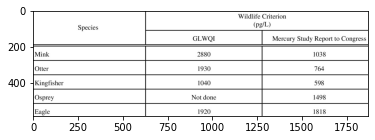

In [ ]:
mostrarImagen(cv2.imread(anoTrain[3]['file']))

In [ ]:
def dic(tabla,filas):
  bbox=tabla['bbox']
  texto=tabla['text']
  ncol=max([len(x) for x in filas]) #buscamos el numero máximo de columnas
  filav2=[x[0]//10 for x in filas]  #nos quedamos con las decenas de los ymin
  xmin=[[] for i in range(0,len(filas))] #una lista por cada fila, almacenamos las coordenadas (xmin,xmax)
  ymin=[[] for i in range(0,len(filas))] #una lista por cada fila, almacenamos las coordenadas (xmin,xmax)
  t=[[] for i in range(0,len(filas))] #una lista por cada fila, almacenamos el texto 
  for i in range(0, len(bbox)):
    if bbox[i][2]//10 in filav2:
      t[filav2.index(bbox[i][2]//10)].append(texto[i])
      xmin[filav2.index(bbox[i][2]//10)].append((bbox[i][0]//10,bbox[i][1]//10))
      ymin[filav2.index(bbox[i][2]//10)].append((bbox[i][2]//10,bbox[i][3]//10))
    else: 
      t[filav2.index( bbox[i][2]//10 -1)].append(texto[i])
      xmin[filav2.index(bbox[i][2]//10 -1)].append((bbox[i][0]//10,bbox[i][1]//10))
      ymin[filav2.index(bbox[i][2]//10 -1)].append((bbox[i][2]//10,bbox[i][3]//10))
  #por cada fila creamos un diccionario con las coordenadas, el texto y el número de columnas de dicha fila
  return [{'x':xmin[i], 'y':ymin[i], 'text':t[i], 'ncol':len(xmin[i])}  for i in range(0,len(xmin))]

In [ ]:
lista=dic(anoTrain[3],filas)

In [ ]:
lista

[{'ncol': 1,
  'text': ['Wildlife Criterion  (pg/L)'],
  'x': [(113, 141)],
  'y': [(0, 9)]},
 {'ncol': 1, 'text': ['Species'], 'x': [(24, 36)], 'y': [(6, 10)]},
 {'ncol': 2,
  'text': ['GLWOI', 'Mercury Study Report to Congress'],
  'x': [(89, 101), (133, 186)],
  'y': [(12, 16), (12, 16)]},
 {'ncol': 3,
  'text': ['1038', '2880', 'Mink'],
  'x': [(155, 163), (91, 98), (0, 9)],
  'y': [(21, 25), (21, 25), (21, 25)]},
 {'ncol': 3,
  'text': ['1930', '7164', 'Otter'],
  'x': [(91, 98), (156, 162), (0, 8)],
  'y': [(29, 33), (29, 33), (29, 33)]},
 {'ncol': 3,
  'text': ['598', 'Kingfisher', '1040'],
  'x': [(156, 162), (0, 16), (91, 98)],
  'y': [(37, 41), (37, 41), (37, 41)]},
 {'ncol': 3,
  'text': ['Not done', '1498', 'Osprev'],
  'x': [(88, 101), (155, 163), (0, 11)],
  'y': [(45, 49), (45, 49), (45, 49)]},
 {'ncol': 3,
  'text': ['1920', '1818', 'Eagle'],
  'x': [(91, 98), (155, 163), (0, 9)],
  'y': [(53, 57), (53, 57), (53, 57)]}]

In [ ]:
def filaNCOL_x(filas, ncol): #dado el diccionario de filas y un numero de columnas, devuelve las coordenadas 
  for f in filas:           # de una fila con nmax columnas
    if f['ncol']==ncol:
      y=f['x'].copy()
      y.sort()
      return y

In [ ]:
nmax=max([len(x) for x in filas])
filaNCOL_x(lista,nmax)

[(0, 9), (91, 98), (155, 163)]

In [ ]:
nmax=max([len(x) for x in filas])
for element in lista:
  if element['ncol']<nmax:
    valoresX=filaNCOL(filas, nmax)
    for x in element['x']:
      if x[0]>valoresX[0]+10:

    

SyntaxError: ignored

In [ ]:
anoTest[0]

{'bbox': [[1718, 1791, 388, 427],
  [1275, 1349, 789, 842],
  [1710, 1794, 877, 916],
  [1283, 1348, 1198, 1270],
  [843, 903, 476, 515],
  [1721, 1792, 477, 515],
  [1718, 1793, 521, 561],
  [1731, 1792, 167, 206],
  [1284, 1348, 1542, 1591],
  [840, 902, 872, 916],
  [1728, 1793, 254, 296],
  [1719, 1792, 302, 339],
  [1277, 1349, 743, 781],
  [832, 901, 1143, 1191],
  [843, 902, 253, 295],
  [1281, 1346, 1899, 1940],
  [831, 903, 785, 851],
  [1732, 1789, 1540, 1601],
  [1735, 1790, 783, 852],
  [1730, 1793, 212, 251],
  [1716, 1795, 566, 605],
  [837, 901, 1276, 1316],
  [1284, 1351, 212, 250],
  [1287, 1349, 167, 205],
  [1718, 1793, 346, 382],
  [1267, 1350, 255, 297],
  [1279, 1349, 1498, 1537],
  [1280, 1347, 1986, 2023],
  [843, 903, 920, 961],
  [1267, 1346, 2295, 2352],
  [1733, 1789, 1497, 1536],
  [1282, 1348, 879, 916],
  [838, 901, 210, 250],
  [1730, 1791, 2383, 2424],
  [845, 902, 610, 649],
  [840, 902, 1984, 2025],
  [1732, 1792, 1144, 1181],
  [1280, 1348, 478, 516]

In [ ]:
dic(anoTrain[3], obtenerFilas(anoTrain[3]))

## Columnas:

In [ ]:
import PIL

In [ ]:
import torchvision.transforms as transforms
def transform_image(image):
    my_transforms = transforms.Compose([transforms.ToTensor(),
                                        transforms.Normalize(
                                            [0.485, 0.456, 0.406],
                                            [0.229, 0.224, 0.225])])
    image_aux = image
    return my_transforms(image_aux).unsqueeze(0).to(device)

In [ ]:
from shutil import copyfile
copyfile('/content/drive/MyDrive/CellDetection/unet.pth', 'unet.pth')

'unet.pth'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 
inf_model = torch.jit.load("unet.pth")
inf_model = inf_model.cpu()
inf_model.eval()

In [ ]:
anoTrain[0]['file']

'datasetYOLO/train/eu-001-2-5.jpg'

In [ ]:
img = PIL.Image.open(anoTrain[0]['file'])

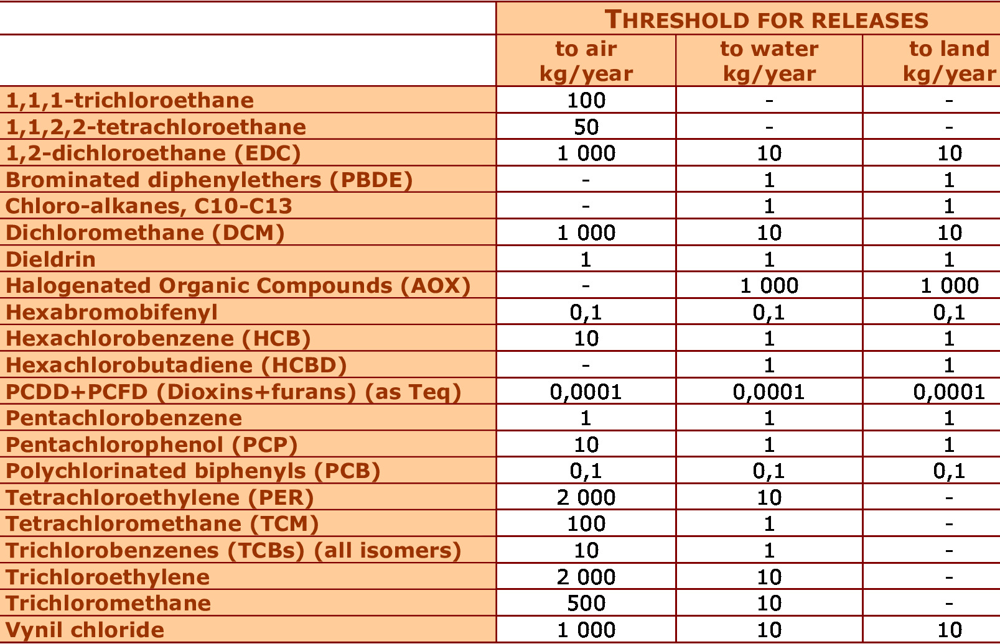

In [ ]:
img

In [ ]:
img.shape

(1036, 1607)

In [ ]:
image = transforms.Resize((600,600))(img)
tensor = transform_image(image=image)

In [ ]:
inf_model.to(device)
with torch.no_grad():
    outputs = inf_model(tensor)
outputs = torch.argmax(outputs,1)

In [ ]:
mask = np.array(outputs.cpu())
mask[mask==1]=255

In [ ]:
mask=np.reshape(mask,(600,600))
mask=np.array(mask,dtype='uint8')

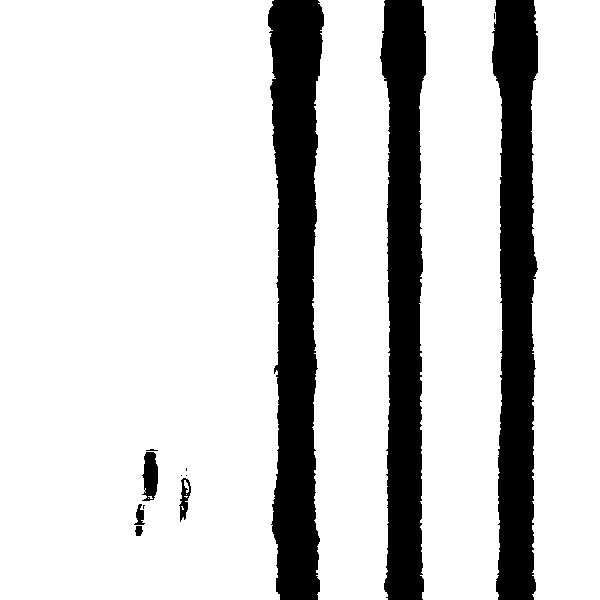

In [ ]:
Image.fromarray(mask.astype('uint8'))

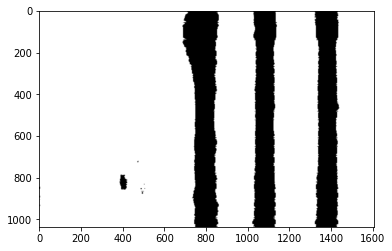

In [ ]:
import cv2
import imutils 

imageOut2 = cv2.resize(mask,dsize=(1607, 1036))
mostrarImagen(imageOut2)

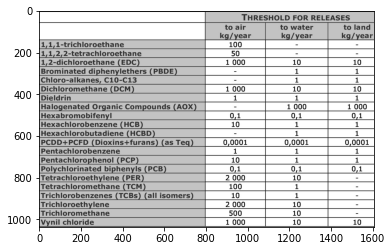

In [ ]:
mostrarImagen(img)

In [ ]:
cnts= cv2.findContours(imageOut2.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts=imutils.grab_contours(cnts)
clone=imageOut2.copy()
clone=cv2.cvtColor(clone,cv2.COLOR_GRAY2RGB) 
l=[]
for c in cnts:
    area = cv2.contourArea(c)
    (x, y, w, h) = cv2.boundingRect(c)
    print(area)
    if area>100:
      cv2.rectangle(clone, (x, y), (x + w, y + h), (0, 0, 255), 5)
      l=l+[[x,y,x + w, y + h]]

In [ ]:
l

[[1421, 0, 1607, 1036],
 [1121, 0, 1349, 1036],
 [834, 0, 1046, 1036],
 [0, 0, 751, 1036]]

In [ ]:
l.sort()

In [ ]:
l

[[0, 0, 751, 1036],
 [834, 0, 1046, 1036],
 [1121, 0, 1349, 1036],
 [1421, 0, 1607, 1036]]

In [ ]:
l[0]

[0, 0, 751, 1036]

In [ ]:
ncol=len(l)

In [ ]:
columnas={i:[coords for coords in anoTrain[0]['bbox'] if coords[0]>l[i][0]-70 and  coords[1]<l[i][2]+70] for i in range(0,ncol)}

In [ ]:
columnas

{0: [[6, 151, 397, 429],
  [2, 337, 907, 940],
  [9, 393, 650, 685],
  [5, 349, 480, 515],
  [25, 543, 565, 600],
  [32, 640, 270, 300],
  [4, 779, 439, 472],
  [0, 482, 226, 259],
  [0, 423, 143, 176],
  [0, 445, 354, 388],
  [0, 763, 864, 896],
  [2, 335, 948, 982],
  [8, 456, 311, 347],
  [12, 259, 991, 1025],
  [8, 506, 525, 559],
  [0, 727, 608, 642],
  [0, 548, 822, 855],
  [13, 455, 695, 728],
  [3, 474, 185, 218],
  [12, 580, 736, 771],
  [2, 523, 780, 812]],
 1: [[863, 1015, 60, 132],
  [890, 989, 226, 258],
  [891, 985, 779, 812],
  [916, 959, 525, 558],
  [907, 970, 821, 854],
  [907, 969, 143, 177],
  [890, 988, 907, 940],
  [882, 995, 609, 643],
  [889, 990, 354, 388],
  [917, 961, 185, 218],
  [917, 961, 864, 896],
  [904, 973, 949, 983],
  [911, 965, 738, 772],
  [917, 960, 697, 730],
  [888, 988, 992, 1025],
  [928, 945, 566, 601],
  [927, 950, 651, 685],
  [928, 945, 269, 302],
  [927, 950, 396, 429],
  [928, 946, 313, 346],
  [911, 966, 480, 514],
  [930, 946, 438, 47

In [ ]:
len(columnas[0])+len(columnas[1])+len(columnas[2])+len(columnas[3])

88

In [ ]:
len(anoTrain[0]['bbox'])

89

Si no es igual ==> hay alguna combinación de columnas

Si la len de cada una de la columna es distinta ==> hay combinación de filas

In [ ]:
from PIL import Image, ImageOps

In [ ]:
im = img.convert("RGB")

In [ ]:
img.shape

(1036, 1607)

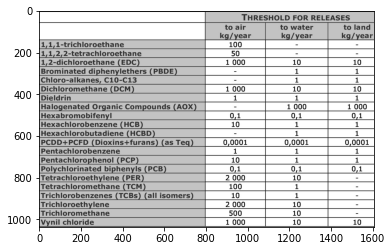

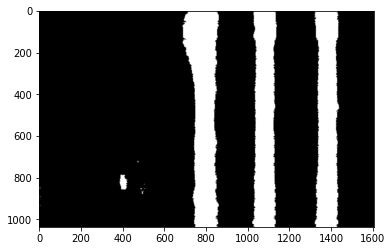

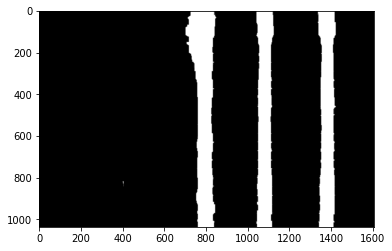

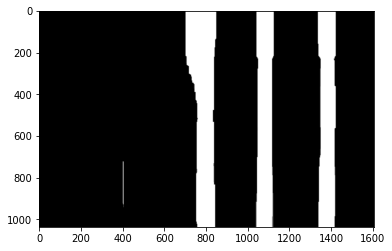

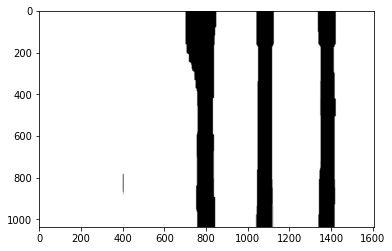

...

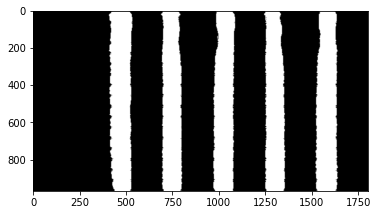

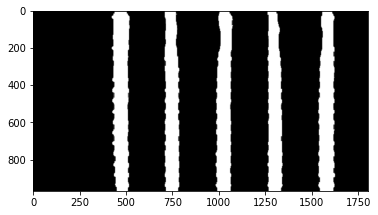

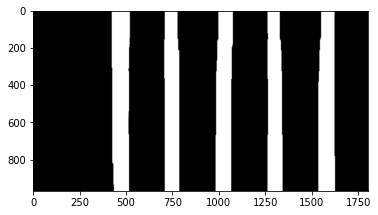

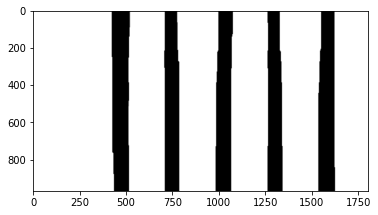

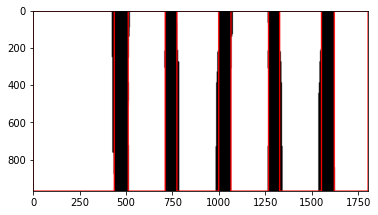

In [ ]:
for a in anoTrain:
  img=cv2.imread(a['file'])
  gray= cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
  img= cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB)
  img=Image.fromarray(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))  
  w,h=img.shape
  mostrarImagen(img)
  image = transforms.Resize((600,600))(img)
  tensor = transform_image(image=image)
  inf_model.to(device)
  with torch.no_grad():
      outputs = inf_model(tensor)
  outputs = torch.argmax(outputs,1)
  mask = np.array(outputs.cpu())
  mask[mask==1]=255
  mask=np.reshape(mask,(600,600))
  mask=np.array(mask,dtype='uint8')
  image = cv2.resize(mask,dsize=(h, w))
  image=(255-image)
  mostrarImagen(image)
  image=cv2.erode(image,kernel = np.ones((9,9)),iterations=3)
  mostrarImagen(image)
  image=cv2.dilate(image,kernel = np.ones((40,1)),iterations=5)
  mostrarImagen(image)
  image=cv2.erode(image,kernel = np.ones((40,1)),iterations=3)
  image=(255-image)
  mostrarImagen(image)
  cnts= cv2.findContours(image.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts=imutils.grab_contours(cnts)
  clone=image.copy()
  clone=cv2.cvtColor(clone,cv2.COLOR_GRAY2RGB) 
  l=[]
  for c in cnts:
      area = cv2.contourArea(c)
      (x, y, w, h) = cv2.boundingRect(c)
      if area>10000:
        cv2.rectangle(clone, (x, y), (x + w, y + h), (0, 0, 255), 5)
        l=l+[[x,y,x + w, y + h]]
  mostrarImagen(clone)
  ncol=len(l)

## Otra aproximación

In [ ]:
img = PIL.Image.open(anoTrain[0]['file'])
img_1=np.zeros(img.shape,dtype='uint8')
img_1[img_1==0]=255
for coords in anoTrain[0]['bbox']:
  img_1[coords[2]:coords[3], coords[0]:coords[1]]=0
img_1= cv2.cvtColor(img_1,cv2.COLOR_GRAY2RGB)

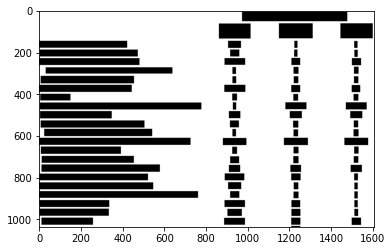

In [ ]:
mostrarImagen(img_1)

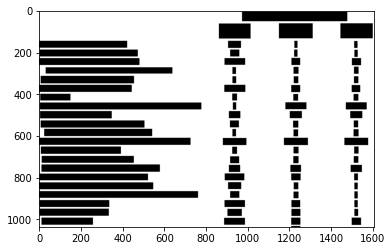

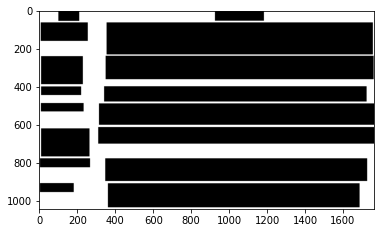

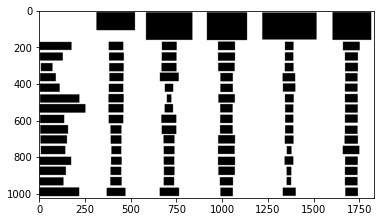

In [ ]:
for anot in anoTrain[:3]:
  img = PIL.Image.open(anot['file'])
  img_1=np.zeros(img.shape,dtype='uint8')
  img_1[img_1==0]=255
  for coords in anot['bbox']:
    img_1[coords[2]:coords[3], coords[0]:coords[1]]=0
  mostrarImagen(img_1)

In [ ]:
anoTrain[0].keys()

dict_keys(['file', 'bbox', 'text'])

In [ ]:
tabla=anoTrain[0]
col=[]
for coords in tabla['bbox']:
  xmin,xmax,ymin,ymax=coords
  if col.count(xmin//100)==0 and col.count(xmin//100 -1)==0:
    col.append(xmin//100)
col.sort()
ncol=len(col)
tab={i:[] for i in col}
for i in range(0, len(tabla['bbox'])):
  xmin,xmax,ymin,ymax=tabla['bbox'][i]
  text=tabla['text'][i]
  try: tab[xmin//100].append([xmin,xmax,ymin,ymax,text])
  except:
    tab[xmin//100-1].append([xmin,xmax,ymin,ymax,text])

In [ ]:
filas=[len(tab[i]) for i in col]
nfilas=max(filas)
combinacion=[x<nfilas for x in filas]
columna=[c[2] for c in tab[col[filas.index(nfilas)]]] #-->ymin de la columna con numero max de filas
columna.sort()
for i in range(0,ncol-1):
    combiFila=False
    combiCol=False
    for celda in tab[col[i]]:
      k=0
      for j in range(i+1,ncol):
        if celda[1]>col[j]*100: #hay combinación de columnas... ¿cuantas columnas?
          k+=1
          combiCol=True
      # Hay combinación de k columnas
      if k>0:
        celda[-1]='\multicolumn{'+str(k+1)+'}{c} {'+celda[-1]+'}'
    
    tab[col[i]]=sorted(tab[col[i]], key=lambda x: x[3])
    for celda in tab[col[i]]:
      print(celda)
      pos,cont=0,0
      for k in range(pos+1,nfilas):
        print(pos)
        print(celda[3],columna[k])
        if celda[3]>columna[k]+10: #hay combinación de fila
          cont+=1
        pos=pos+cont
      if cont>0:
        celda[-1]='\multirow{'+str(cont+1)+'}{c} {'+celda[-1]+'}'

In [ ]:
col

[0, 8, 11, 14]

In [ ]:
tab

{0: [[0, 423, 143, 176, '\\multirow{3}{c} {1,1,1-trichloroethane}'],
  [3, 474, 185, 218, '\\multirow{4}{c} {1,1,2,2-tetrachloroethan:}'],
  [0, 482, 226, 259, '\\multirow{5}{c} {1,2-dichloroethane (EDC)}'],
  [32, 640, 270, 300, '\\multirow{6}{c} {rominated diphenvlethers (PBDE}'],
  [8, 456, 311, 347, '\\multirow{7}{c} {Chloro-alkanes, C10-C1:}'],
  [0, 445, 354, 388, '\\multirow{8}{c} {Dichloromethane (DCM}'],
  [6, 151, 397, 429, '\\multirow{9}{c} {Dieldrin}'],
  [4,
   779,
   439,
   472,
   '\\multirow{10}{c} {Halogenated Oraanic Compounds (AOX)}'],
  [5, 349, 480, 515, '\\multirow{11}{c} {Hexabromobifenvl}'],
  [8, 506, 525, 559, '\\multirow{12}{c} {Hexachlorobenzene (HCB)}'],
  [25, 543, 565, 600, '\\multirow{13}{c} {lexachlorobutadiene (HCBD}'],
  [0, 727, 608, 642, '\\multirow{14}{c} {PCDD+PCFD (Dioxins+furans) (as Tea}'],
  [9, 393, 650, 685, '\\multirow{15}{c} {Pentachlorobenzene}'],
  [13, 455, 695, 728, '\\multirow{16}{c} {Pentachlorophenol (PCE}'],
  [12, 580, 736, 771,

In [ ]:
img = PIL.Image.open(anoTrain[0]['file'])

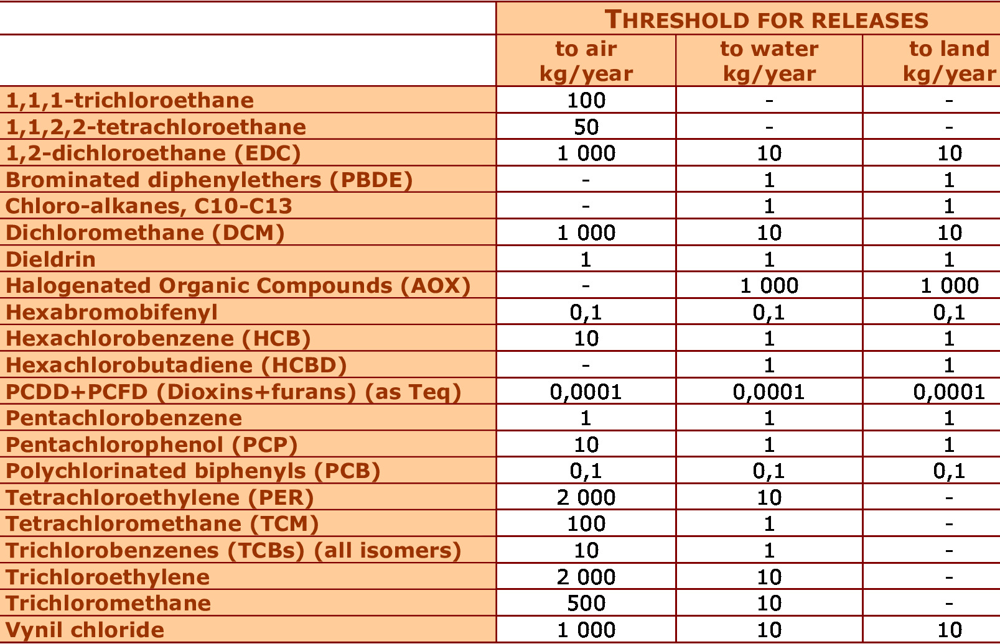

In [ ]:
img

In [ ]:
col

[0, 8, 11, 14]

In [ ]:
col.sort()

In [ ]:
lista=[0,1,3,5]
lista.count(1)

1

In [ ]:
def columnas(tabla):
  

In [ ]:
#caso particular
bbox=anoTrain[0]['bbox']
texto=anoTrain[0]['text']
ncol=max([len(x) for x in filas]) #buscamos el numero máximo de columnas
filav2=[x[0]//10 for x in filas]  #nos quedamos con las decenas de los ymin
xmin=[[] for i in range(0,len(filas))] #una lista por cada fila, almacenamos las coordenadas (xmin,xmax)
t=[[] for i in range(0,len(filas))] #una lista por cada fila, almacenamos el texto 
for i in range(0, len(bbox)):
  if bbox[i][2]//10 in filav2:
    t[filav2.index(bbox[i][2]//10)].append(texto[i])
    xmin[filav2.index(bbox[i][2]//10)].append((bbox[i][0]//10,bbox[i][1]//10))
  else: 
    t[filav2.index( bbox[i][2]//10 -1)].append(texto[i])
    xmin[filav2.index(bbox[i][2]//10 -1)].append((bbox[i][0]//10,bbox[i][1]//10))
#por cada fila creamos un diccionario con las coordenadas, el texto y el número de columnas de dicha fila
filas=[{'x':xmin[i], 'text':t[i], 'ncol':len(xmin[i])}  for i in range(0,len(xmin))]

## OOOOTRA

In [ ]:
filas=sorted(anoTrain[0]['bbox'], key=lambda x: x[2])

In [ ]:
def obtenerFilas(tabla):
  tab=[]
  shape=cv2.imread(tabla['file']).shape
  for i in range(0, len(tabla['bbox'])):
    xmin,xmax,ymin,ymax=tabla['bbox'][i]
    text=tabla['text'][i]
    tab.append([xmin,xmax,ymin,ymax,text])
  l2=sorted(tab, key=lambda x: x[2])
  print(l2)
  ant=l2[0]
  i=0
  filas=[[]]
  for x in l2:  #separamos en filas según los ymin.
    if x[2]< ant[2]+shape[0]*0.01:
      filas[i].append(x)
    else:
      i+=1
      filas.append([x])
    ant=x
  return filas

In [ ]:
filas=obtenerFilas(anoTrain[3])
for f in filas:
  mx=max([x[3] for x in f])
  mn=min([x[3] for x in f])
  if (mx-mn)//10>1: #combinación de filas
    print('Combinación de filas')

[[1137, 1413, 2, 90, 'Wildlife Criterion  (pg/L)'], [247, 365, 66, 104, 'Species'], [1330, 1860, 128, 167, 'Mercury Study Report to Congress'], [890, 1018, 129, 167, 'GLWOI'], [1556, 1631, 216, 254, '1038'], [911, 989, 216, 254, '2880'], [4, 91, 216, 255, 'Mink'], [914, 989, 296, 333, '1930'], [1563, 1621, 296, 333, '7164'], [9, 87, 297, 334, 'Otter'], [1564, 1621, 377, 415, '598'], [6, 167, 379, 416, 'Kingfisher'], [912, 988, 379, 416, '1040'], [884, 1016, 458, 495, 'Not done'], [1556, 1630, 458, 495, '1498'], [6, 116, 458, 494, 'Osprev'], [913, 989, 536, 575, '1920'], [1556, 1631, 537, 575, '1818'], [4, 94, 537, 575, 'Eagle']]


In [ ]:
filas

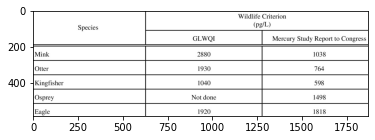

In [ ]:
for tabla in anoTrain[3:4]:
  img=cv2.imread(tabla['file'])
  mostrarImagen(img)

In [ ]:
for f in filas:
  print(max([x[3] for x in f]))

49
132
177
220
260
302
347
389
430
473
515
559
601
643
685
730
772
812
855
899
941
983
1026
1037


In [ ]:
max([len(f) for f in filas])

4

In [ ]:
columnas=sorted(filas, key=lambda x: x[0])

In [ ]:
columnas

[[0, 423, 143, 176],
 [0, 482, 226, 259],
 [0, 445, 354, 388],
 [0, 727, 608, 642],
 [0, 548, 822, 855],
 [0, 763, 864, 896],
 [2, 523, 780, 812],
 [2, 337, 907, 940],
 [2, 335, 948, 982],
 [3, 474, 185, 218],
 [4, 779, 439, 472],
 [5, 349, 480, 515],
 [6, 151, 397, 429],
 [8, 456, 311, 347],
 [8, 506, 525, 559],
 [9, 393, 650, 685],
 [12, 580, 736, 771],
 [12, 259, 991, 1025],
 [13, 455, 695, 728],
 [25, 543, 565, 600],
 [32, 640, 270, 300],
 [863, 1015, 60, 132],
 [882, 995, 609, 643],
 [888, 988, 992, 1025],
 [889, 990, 354, 388],
 [890, 989, 226, 258],
 [890, 988, 907, 940],
 [891, 985, 779, 812],
 [904, 973, 949, 983],
 [907, 969, 143, 177],
 [907, 970, 821, 854],
 [911, 966, 480, 514],
 [911, 965, 738, 772],
 [916, 959, 525, 558],
 [917, 961, 185, 218],
 [917, 960, 697, 730],
 [917, 961, 864, 896],
 [927, 950, 396, 429],
 [927, 950, 651, 685],
 [928, 945, 269, 302],
 [928, 946, 313, 346],
 [928, 945, 566, 601],
 [930, 946, 438, 473],
 [974, 1479, 3, 49],
 [1151, 1313, 59, 131],
 